In [1]:
pip install datasets faiss-gpu faiss-cpu

In [2]:
import torch
import pandas as pd
from datasets import load_dataset, Dataset
from transformers import AutoTokenizer, AutoModel, AutoModelForSequenceClassification
import numpy as np

In [3]:
from datasets import load_dataset

squad_dataset = load_dataset("sentence-transformers/squad", split="train")
squad_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Dataset({
    features: ['question', 'answer'],
    num_rows: 87599
})

In [4]:
squad_dataset.set_format("pandas")
df = squad_dataset[:]
df.head()

,question,answer
0,To whom did the Virgin Mary allegedly appear i...,"Architecturally, the school has a Catholic cha..."
1,What is in front of the Notre Dame Main Building?,"Architecturally, the school has a Catholic cha..."
2,The Basilica of the Sacred heart at Notre Dame...,"Architecturally, the school has a Catholic cha..."
3,What is the Grotto at Notre Dame?,"Architecturally, the school has a Catholic cha..."
4,What sits on top of the Main Building at Notre...,"Architecturally, the school has a Catholic cha..."


In [7]:
from datasets import Dataset

dataset = Dataset.from_pandas(df)
dataset

Dataset({
    features: ['question', 'answer'],
    num_rows: 87599
})

In [8]:
df.head()

,question,answer
0,To whom did the Virgin Mary allegedly appear i...,"Architecturally, the school has a Catholic cha..."
1,What is in front of the Notre Dame Main Building?,"Architecturally, the school has a Catholic cha..."
2,The Basilica of the Sacred heart at Notre Dame...,"Architecturally, the school has a Catholic cha..."
3,What is the Grotto at Notre Dame?,"Architecturally, the school has a Catholic cha..."
4,What sits on top of the Main Building at Notre...,"Architecturally, the school has a Catholic cha..."


# Osadzenia zapytań i dokumentów

In [9]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [10]:
from sentence_transformers import SentenceTransformer

model_name = "sentence-transformers/multi-qa-mpnet-base-dot-v1"
embedder = SentenceTransformer(model_name, device=device)

# Corpus with example sentences
corpus = df["answer"].tolist()
# Query sentences:
queries = df["question"].tolist()
corpus_set = list(set(corpus))
corpus_to_set_index = {ans: i for i, ans in enumerate(corpus_set)}


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/212 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/8.71k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [11]:
corpus_set.__len__(), queries.__len__()


(18891, 87599)

In [12]:
# Use "convert_to_tensor=True" to keep the tensors on GPU (if available)
corpus_embeddings = embedder.encode(corpus_set, convert_to_tensor=True, show_progress_bar=True, batch_size=64)

Batches:   0%|          | 0/296 [00:00<?, ?it/s]

In [13]:
query_embeddings = embedder.encode(queries, convert_to_tensor=True, show_progress_bar=True, batch_size=64)


Batches:   0%|          | 0/1369 [00:00<?, ?it/s]

In [15]:
# Metryki
top_k = 5
correct_top1, correct_top5 = 0, 0
total_reciprocal_rank = 0
total_average_precision = 0
from tqdm import tqdm
# Iteracja przez zapytania
for i in tqdm(range(len(queries))):
    # Oblicz podobieństwo kosinusowe
    similarity_scores = torch.nn.functional.cosine_similarity(query_embeddings[i].unsqueeze(0), corpus_embeddings)
    scores, indices = torch.topk(similarity_scores, k=top_k)

    # Prawidłowy indeks z corpus_set
    ground_truth_idx = corpus_to_set_index[corpus[i]]

    # Sprawdzenie poprawności
    if ground_truth_idx == indices[0]:  # Top-1
        correct_top1 += 1
    if ground_truth_idx in indices:  # Top-5
        correct_top5 += 1

    # Obliczanie MRR
    for rank, idx in enumerate(indices):
        if ground_truth_idx == idx:
            total_reciprocal_rank += 1.0 / (rank + 1)
            break

    # Obliczanie MAP
    relevant = 0
    precision_at_k = 0
    for rank, idx in enumerate(indices):
        if ground_truth_idx == idx:
            relevant += 1
            precision_at_k += relevant / (rank + 1)
    if relevant > 0:
        average_precision = precision_at_k / relevant
        total_average_precision += average_precision

# Obliczenie metryk
num_queries = len(queries)
top1_accuracy = correct_top1 / num_queries
top5_accuracy = correct_top5 / num_queries
mrr = total_reciprocal_rank / num_queries
map_score = total_average_precision / num_queries

print(f"Top-1 Accuracy: {top1_accuracy:.4f}")
print(f"Top-5 Accuracy: {top5_accuracy:.4f}")
print(f"MRR: {mrr:.4f}")
print(f"MAP: {map_score:.4f}")


100%|██████████| 87599/87599 [03:27<00:00, 421.67it/s]

Top-1 Accuracy: 0.6452
Top-5 Accuracy: 0.8739
MRR: 0.7365
MAP: 0.7365


In [21]:
# Metryki
top_k = 5
correct_top1, correct_top5 = 0, 0
total_reciprocal_rank = 0
total_average_precision = 0
from tqdm import tqdm
# Iteracja przez zapytania
_queries_idx = np.random.choice(len(queries), 1000, replace=False)
for i in tqdm(_queries_idx):
    # Oblicz podobieństwo kosinusowe
    similarity_scores = torch.nn.functional.cosine_similarity(query_embeddings[i].unsqueeze(0), corpus_embeddings)
    scores, indices = torch.topk(similarity_scores, k=top_k)

    # Prawidłowy indeks z corpus_set
    ground_truth_idx = corpus_to_set_index[corpus[i]]

    # Sprawdzenie poprawności
    if ground_truth_idx == indices[0]:  # Top-1
        correct_top1 += 1
    if ground_truth_idx in indices:  # Top-5
        correct_top5 += 1

    # Obliczanie MRR
    for rank, idx in enumerate(indices):
        if ground_truth_idx == idx:
            total_reciprocal_rank += 1.0 / (rank + 1)
            break

    # Obliczanie MAP
    relevant = 0
    precision_at_k = 0
    for rank, idx in enumerate(indices):
        if ground_truth_idx == idx:
            relevant += 1
            precision_at_k += relevant / (rank + 1)
    if relevant > 0:
        average_precision = precision_at_k / relevant
        total_average_precision += average_precision

# Obliczenie metryk
num_queries = len(_queries_idx)
top1_accuracy = correct_top1 / num_queries
top5_accuracy = correct_top5 / num_queries
mrr = total_reciprocal_rank / num_queries
map_score = total_average_precision / num_queries

print(f"Top-1 Accuracy: {top1_accuracy:.4f}")
print(f"Top-5 Accuracy: {top5_accuracy:.4f}")
print(f"MRR: {mrr:.4f}")
print(f"MAP: {map_score:.4f}")


100%|██████████| 1000/1000 [00:02<00:00, 423.49it/s]

Top-1 Accuracy: 0.6460
Top-5 Accuracy: 0.8870
MRR: 0.7396
MAP: 0.7396


# Indeksowanie z FAISS

In [ ]:
import faiss
import numpy as np

# Konwersja osadzeń na NumPy dla FAISS
corpus_embeddings_np = corpus_embeddings.cpu().numpy()
query_embeddings_np = query_embeddings.cpu().numpy()

faiss.normalize_L2(query_embeddings_np)  # Normalizacja zapytań
faiss.normalize_L2(corpus_embeddings_np)  # Normalizacja korpusu

# Utworzenie indeksu FAISS
dimension = corpus_embeddings_np.shape[1]  # Wymiar osadzeń
index = faiss.IndexFlatL2(dimension)  # Indeks z metryką L2 (euklidesową)
index.add(corpus_embeddings_np)  # Dodanie osadzeń do indeksu

# Wyszukiwanie najbliższych sąsiadów
top_k = 5
_, indices = index.search(query_embeddings_np, top_k)

In [25]:
# Metryki oceny
correct_top1, correct_top5 = 0, 0
total_reciprocal_rank = 0
total_average_precision = 0

# Ewaluacja dla każdego zapytania
for i in tqdm(range(len(queries))):
    top_indices = indices[i]  # Indeksy top-k z FAISS
    ground_truth_idx = corpus_to_set_index[corpus[i]]  # Indeks ground truth w corpus_set

    # Top-1 i Top-5 Accuracy
    if ground_truth_idx == top_indices[0]:  # Top-1
        correct_top1 += 1
    if ground_truth_idx in top_indices:  # Top-5
        correct_top5 += 1

    # MRR (Mean Reciprocal Rank)
    for rank, idx in enumerate(top_indices):
        if ground_truth_idx == idx:
            total_reciprocal_rank += 1.0 / (rank + 1)
            break

    # MAP (Mean Average Precision)
    relevant = 0
    precision_at_k = 0
    for rank, idx in enumerate(top_indices):
        if ground_truth_idx == idx:
            relevant += 1
            precision_at_k += relevant / (rank + 1)
    if relevant > 0:
        average_precision = precision_at_k / relevant
        total_average_precision += average_precision

# Obliczenie metryk
num_queries = len(queries)
top1_accuracy = correct_top1 / num_queries
top5_accuracy = correct_top5 / num_queries
mrr = total_reciprocal_rank / num_queries
map_score = total_average_precision / num_queries

# Wyświetlenie wyników
print(f"Top-1 Accuracy: {top1_accuracy:.4f}")
print(f"Top-5 Accuracy: {top5_accuracy:.4f}")
print(f"MRR: {mrr:.4f}")
print(f"MAP: {map_score:.4f}")


100%|██████████| 87599/87599 [00:00<00:00, 106803.40it/s]

Top-1 Accuracy: 0.6452
Top-5 Accuracy: 0.8739
MRR: 0.7365
MAP: 0.7365


# Metryki

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import faiss

ground_truth = corpus

# Funkcja pomocnicza do obliczania MRR
def mean_reciprocal_rank(ground_truth, indices, corpus_to_set_index, corpus_set):
    mrr = 0
    for i, gt in enumerate(ground_truth):
        ground_truth_idx = corpus_to_set_index[gt]  # Indeks w corpus_set
        for rank, idx in enumerate(indices[i]):
            if idx == ground_truth_idx:
                mrr += 1 / (rank + 1)  # Odwrotność rangi
                break
    return mrr / len(ground_truth)

# Funkcja pomocnicza do obliczania MAP
def mean_average_precision(ground_truth, indices, corpus_to_set_index, corpus_set):
    map_score = 0
    for i, gt in enumerate(ground_truth):
        ground_truth_idx = corpus_to_set_index[gt]  # Indeks w corpus_set
        relevant = 0
        precision_sum = 0
        for rank, idx in enumerate(indices[i]):
            if idx == ground_truth_idx:
                relevant += 1
                precision_sum += relevant / (rank + 1)
        map_score += precision_sum / relevant if relevant > 0 else 0
    return map_score / len(ground_truth)

# Normalizacja osadzeń
query_embeddings_np = query_embeddings.cpu().numpy()
corpus_embeddings_np = corpus_embeddings.cpu().numpy()

faiss.normalize_L2(query_embeddings_np)  # Normalizacja zapytań
faiss.normalize_L2(corpus_embeddings_np)  # Normalizacja korpusu

# Utworzenie indeksu FAISS z Inner Product (dla cosine similarity)
dimension = corpus_embeddings_np.shape[1]
index = faiss.IndexFlatIP(dimension)
index.add(corpus_embeddings_np)  # Dodanie znormalizowanych osadzeń do indeksu

# Przygotowanie zmiennych
corpus_set = list(set(corpus))  # Usunięcie duplikatów z korpusu
corpus_to_set_index = {ans: i for i, ans in enumerate(corpus_set)}  # Mapowanie odpowiedzi na indeksy

# Metryki
top_k_values = list(range(1, 16))  # Top-k od 1 do 15
top1_accuracies = []
top5_accuracies = []
mrr_values = []
map_values = []

# Pętla po wartościach top_k
for top_k in tqdm(top_k_values):
    correct_top1, correct_top5 = 0, 0
    _, indices = index.search(query_embeddings_np, top_k)  # FAISS wyszukiwanie najbliższych sąsiadów

    for i in range(len(queries)):
        ground_truth_idx = corpus_to_set_index[ground_truth[i]]  # Indeks prawidłowej odpowiedzi
        top_indices = indices[i]  # Top-k indeksy dla zapytania

        # Top-1 i Top-5 Accuracy
        if top_indices[0] == ground_truth_idx:
            correct_top1 += 1
        if ground_truth_idx in top_indices:
            correct_top5 += 1

    # Obliczenie metryk
    top1_accuracy_faiss = correct_top1 / len(queries)
    top5_accuracy_faiss = correct_top5 / len(queries)
    mrr_faiss = mean_reciprocal_rank(ground_truth, indices, corpus_to_set_index, corpus_set)
    map_faiss = mean_average_precision(ground_truth, indices, corpus_to_set_index, corpus_set)

    # Dodanie wyników do list
    top1_accuracies.append(top1_accuracy_faiss)
    top5_accuracies.append(top5_accuracy_faiss)
    mrr_values.append(mrr_faiss)
    map_values.append(map_faiss)


100%|██████████| 15/15 [09:11<00:00, 36.80s/it]


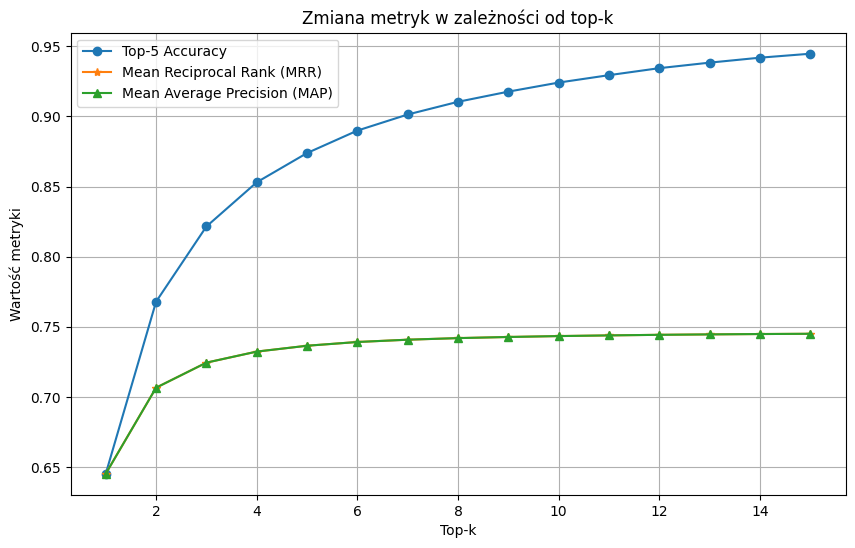

In [30]:
# Wykres
plt.figure(figsize=(10, 6))

plt.plot(top_k_values, top5_accuracies, label="Top-5 Accuracy", marker='o')
plt.plot(top_k_values, mrr_values, label="Mean Reciprocal Rank (MRR)", marker='*')
plt.plot(top_k_values, map_values, label="Mean Average Precision (MAP)", marker='^')

plt.xlabel("Top-k")
plt.ylabel("Wartość metryki")
plt.title("Zmiana metryk w zależności od top-k")
plt.legend()
plt.grid(True)
plt.show()

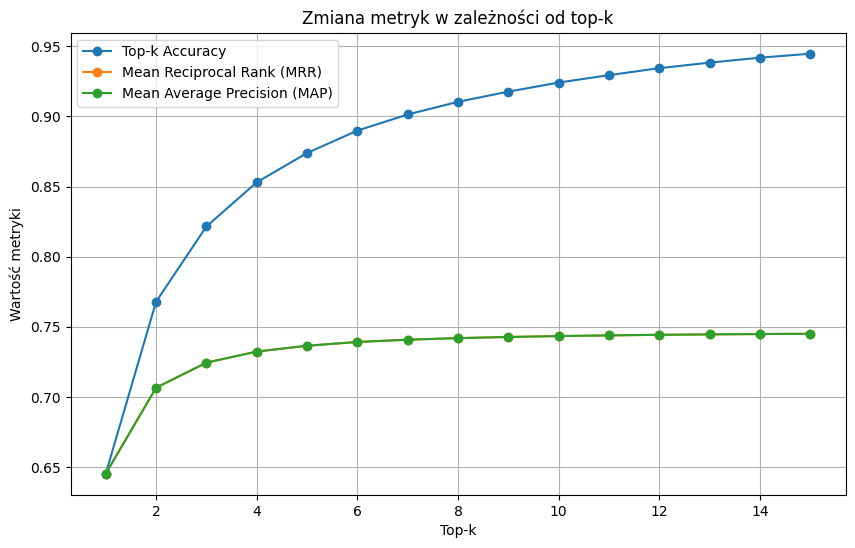

In [ ]:
# Wykres
plt.figure(figsize=(10, 6))

plt.plot(top_k_values, top5_accuracies, label="Top-k Accuracy", marker='o')
plt.plot(top_k_values, mrr_values, label="Mean Reciprocal Rank (MRR)", marker='o')
plt.plot(top_k_values, map_values, label="Mean Average Precision (MAP)", marker='o')

plt.xlabel("Top-k")
plt.ylabel("Wartość metryki")
plt.title("Zmiana metryk w zależności od top-k")
plt.legend()
plt.grid(True)
plt.show()

# Wnioski:
* Wyniki z FAISS i bez FAISS wyszły takie same
* Kiedy nie znormalizujemy embeddingów przy faiss, to dostajemy ciut gorsze wyniki
* FAISS jest o wiele szybsze (10s) od wyszukiwania iloczynem skalarnym (7 minut)

# Przykłady

In [ ]:
import random
top_k = 5

random.seed(42)
for query in random.choices(queries, k=5):
    query_embedding = embedder.encode(query, convert_to_tensor=True)

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    similarity_scores = embedder.similarity(query_embedding, corpus_embeddings)[0]
    scores, indices = torch.topk(similarity_scores, k=top_k)

    print("\nQuery:", query)
    print("Top 5 most similar sentences in corpus:")

    for score, idx in zip(scores, indices):
        # Przypisanie poprawnego indeksu w corpus_set
        correct_index = idx.item()  # Zamiana tensora na wartość indeksu
        print(f"{corpus_set[correct_index]} (Index: {correct_index}, Score: {score:.4f})")


Query: Where is the Four Seasons Town Center located?
Top 5 most similar sentences in corpus:
North Carolina has a variety of shopping choices. SouthPark Mall in Charlotte is currently the largest in the Carolinas, with almost 2.0 million square feet. Other major malls in Charlotte include Northlake Mall and Carolina Place Mall in nearby suburb Pineville. Other major malls throughout the state include Hanes Mall in Winston-Salem; Crabtree Valley Mall, North Hills Mall, and Triangle Town Center in Raleigh; Friendly Center and Four Seasons Town Centre in Greensboro; Oak Hollow Mall in High Point; Concord Mills in Concord; Valley Hills Mall in Hickory; and The Streets at Southpoint and Northgate Mall in Durham and Independence Mall in Wilmington, NC, and Tanger Outlets in Charlotte, Nags Head, Blowing Rock, and Mebane, NC. (Index: 14951, Score: 19.1315)
As one of the oldest parts of town, Central Tucson is anchored by the Broadway Village shopping center designed by local architect Josia

#Embedingi

In [49]:
pip install tsnecuda libcudart

ERROR: Could not find a version that satisfies the requirement libcudart (from versions: none)
ERROR: No matching distribution found for libcudart


In [52]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
combined_embeddings = torch.concat((query_embeddings, corpus_embeddings))


In [55]:
reduced_embeddings = tsne.fit_transform(combined_embeddings.cpu().numpy())

In [56]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [62]:
reduced_embeddings.shape, len(queries) + len(set(corpus))

((106490, 2), 106490)

In [193]:
embeddings_df = pd.DataFrame(reduced_embeddings)
embeddings_df['label'] = ['query'] * len(queries) + ['corpus'] * len(corpus_set)
embeddings_df["text"] = queries + corpus_set
embeddings_df.columns = ["x", "y", "label", "text"]
embeddings_df["related_answer"] = corpus + corpus_set

In [102]:
import plotly.express as px

fig = px.scatter(
    embeddings_df.sample(10000, replace=False),
    x='x',
    y='y',
    color='related_answer',  # Koloruj punkty w zależności od zapytania
    hover_data=['text', "related_answer"],  # Wyświetlaj dodatkowe informacje po najechaniu myszką
    title="Wizualizacja t-SNE zapytań i wyników",
)

fig.update_traces(   showlegend=False)
fig.show()

In [176]:
embeddings_df.iloc[idxs]

,x,y,label,text,related_answer,wrapped_text,wrapped_related_answer
0,38.721668,-85.922905,query,To whom did the Virgin Mary allegedly appear i...,"Architecturally, the school has a Catholic cha...",To whom did the Virgin Mary allegedly appear i...,"Architecturally, the school has a Catholic cha..."
1,-56.359093,34.864883,query,What is in front of the Notre Dame Main Building?,"Architecturally, the school has a Catholic cha...",What is in front of the Notre Dame Main Building?,"Architecturally, the school has a Catholic cha..."
2,-56.347553,35.514687,query,The Basilica of the Sacred heart at Notre Dame...,"Architecturally, the school has a Catholic cha...",The Basilica of the Sacred heart at Notre Dame...,"Architecturally, the school has a Catholic cha..."
3,-56.488968,35.227985,query,What is the Grotto at Notre Dame?,"Architecturally, the school has a Catholic cha...",What is the Grotto at Notre Dame?,"Architecturally, the school has a Catholic cha..."
4,-56.334747,34.844299,query,What sits on top of the Main Building at Notre...,"Architecturally, the school has a Catholic cha...",What sits on top of the Main Building at Notre...,"Architecturally, the school has a Catholic cha..."
87599,-88.939095,-35.422482,corpus,The administration of justice was of particula...,None,The administration of justice was of particula...,None


In [205]:
import plotly.express as px

idx =  5*5
idxs = [i for i in range(idx, idx+5)] + (embeddings_df[embeddings_df["text"]== embeddings_df.iloc[idx]["related_answer"]].index).tolist()

fig = px.scatter(
    embeddings_df.iloc[idxs],
    x='x',
    y='y',
    color='label',  # Koloruj punkty w zależności od zapytania
    hover_data=['text', "related_answer"],  # Wyświetlaj dodatkowe informacje po najechaniu myszką
    title="Wizualizacja t-SNE zapytań i wyników",
)

fig.update_traces(   showlegend=False)
fig.show()

# Reranker

In [103]:
class ReRanker:
    def __init__(self, model_ckpt):
        self.tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
        self.model = AutoModelForSequenceClassification.from_pretrained(model_ckpt)
        self.device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
        self.model.to(self.device)

    def rerank(self, query: str, candidates: list):
        scores = []
        for candidate in candidates:
            input_pair = self.tokenizer(
                query, candidate, truncation=True, padding=True, return_tensors="pt"
            ).to(self.device)

            with torch.no_grad():
                output = self.model(**input_pair)
                score = output.logits.squeeze().item()  # Ostateczny wynik trafności
                scores.append(score)

        # Posortowanie dokumentów według trafności
        sorted_indices = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)
        sorted_candidates = [candidates[i] for i in sorted_indices]
        sorted_scores = [scores[i] for i in sorted_indices]

        return sorted_candidates, sorted_scores, sorted_indices

In [104]:
reranker = ReRanker("cross-encoder/ms-marco-TinyBERT-L-6")

tokenizer_config.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [141]:
for query in np.random.choice(queries, 1):
    query_embedding = embedder.encode(query, convert_to_tensor=True)
    similarity_scores = embedder.similarity(query_embedding, corpus_embeddings)[0]
    scores, indices = torch.topk(similarity_scores, k=5)
    candidates = [corpus_set[i] for i in indices.cpu().tolist() ]
    reranked_candidates, reranked_scores, sorted_indices = reranker.rerank(query, candidates)
    print(f"Query: {query}")
    for i, (doc, score, text_ids) in enumerate(zip(reranked_candidates, reranked_scores, sorted_indices)):
            print(f"Rank {i + 1}:")
            print(f"Score: {score}")
            print(f"Text IDs: {text_ids}")
            # print(f"Document: {doc}")
            print("=" * 50)

Query: What 1812 event turned Napoleon's attention back to France?
Rank 1:
Score: 1.6373370885849
Text IDs: 2
Rank 2:
Score: -1.460792899131775
Text IDs: 4
Rank 3:
Score: -1.7710601091384888
Text IDs: 0
Rank 4:
Score: -2.3852789402008057
Text IDs: 1
Rank 5:
Score: -4.036097526550293
Text IDs: 3


5000it [03:48, 21.93it/s]


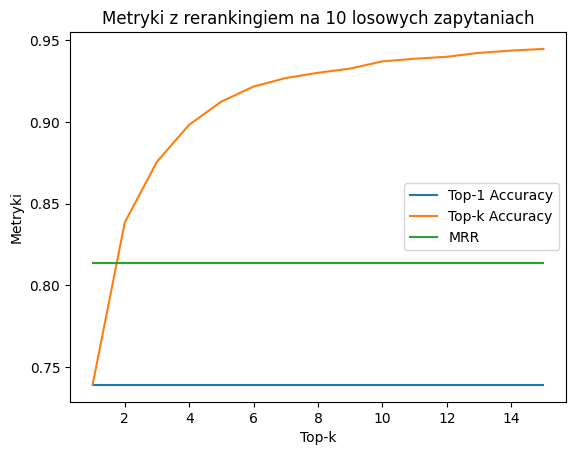

In [155]:
import random

# Losowanie 10 losowych zapytań
sample_indices = random.sample(range(len(queries)), 5000)  # Indeksy losowych zapytań
sampled_queries = [queries[i] for i in sample_indices]
sampled_ground_truth = [ground_truth[i] for i in sample_indices]

# FAISS wyszukiwanie top-k
top_k_faiss = 15  # Liczba dokumentów do pobrania z FAISS przed rerankingiem
_, faiss_indices = index.search(query_embeddings_np[sample_indices], top_k_faiss)

def rerank_top_k(queries, corpus, indices, reranker):
    reranked_results = []
    for i, query in tqdm(enumerate(queries)):
        # Pobranie kandydatów z FAISS
        candidates = [corpus[idx] for idx in indices[i]]  # Top-k wyników
        # Reranking
        sorted_candidates, _, sorted_indices = reranker.rerank(query, candidates)
        # Mapowanie na indeksy korpusu
        reranked_indices = [corpus_to_set_index[candidate] for candidate in sorted_candidates]
        reranked_results.append(reranked_indices)
    return reranked_results
# Reranking tylko wyników top-k
reranked_indices = rerank_top_k(sampled_queries, corpus_set, faiss_indices, reranker)

# Obliczanie metryk na podstawie wyników po rerankingu
top_k_values = list(range(1, top_k_faiss + 1))  # Top-k do ewaluacji
top1_accuracies, topk_accuracies, mrr_values = [], [], []

for top_k in top_k_values:
    correct_top1, correct_topk = 0, 0
    for i in range(len(sampled_queries)):
        ground_truth_idx = corpus_to_set_index[sampled_ground_truth[i]]  # Indeks prawidłowej odpowiedzi
        top_indices = reranked_indices[i][:top_k]  # Top-k po rerankingu

        # Top-1 i Top-k Accuracy
        if top_indices[0] == ground_truth_idx:
            correct_top1 += 1
        if ground_truth_idx in top_indices:
            correct_topk += 1

    # Obliczenie metryk
    top1_accuracy_reranked = correct_top1 / len(sampled_queries)
    topk_accuracy_reranked = correct_topk / len(sampled_queries)
    mrr_reranked = mean_reciprocal_rank(sampled_ground_truth, reranked_indices, corpus_to_set_index, corpus_set)

    # Dodanie wyników do list
    top1_accuracies.append(top1_accuracy_reranked)
    topk_accuracies.append(topk_accuracy_reranked)
    mrr_values.append(mrr_reranked)

# Wizualizacja wyników
plt.plot(top_k_values, top1_accuracies, label="Top-1 Accuracy")
plt.plot(top_k_values, topk_accuracies, label="Top-k Accuracy")
plt.plot(top_k_values, mrr_values, label="MRR")
plt.xlabel("Top-k")
plt.ylabel("Metryki")
plt.legend()
plt.title("Metryki z rerankingiem na 10 losowych zapytaniach")
plt.show()


In [ ]:
# prompt: save all variable in direcotry /content/drive/MyDrive/studia/NLP/semantic_search/save

import os
import shutil

# Define the directory path
save_directory = "/content/drive/MyDrive/studia/NLP/semantic_search/save"

# Create the directory if it doesn't exist
os.makedirs(save_directory, exist_ok=True)

# List of variables to save
variables_to_save = ["corpus_embeddings", "query_embeddings", "queries", "corpus", "corpus_set", "corpus_to_set_index", "index", "top_k", "embedder", "ground_truth", "top1_accuracies", "top5_accuracies", "mrr_values", "map_values","top_k_values", "reranker", "sampled_queries", "sampled_ground_truth", "faiss_indices", "reranked_indices", "top1_accuracy_reranked", "topk_accuracy_reranked", "mrr_reranked", "correct_top1", "correct_top5", "num_queries", "top1_accuracy", "top5_accuracy", "mrr", "map_score"]

# Iterate over variables and save them (if they exist in the current environment)
for var_name in variables_to_save:
  if var_name in locals() or var_name in globals():
      try:
          # Save using pickle if possible, otherwise use torch.save for tensors
          import pickle
          if isinstance(locals().get(var_name, None), torch.Tensor) or isinstance(globals().get(var_name, None), torch.Tensor):
              torch.save(locals().get(var_name, globals()[var_name]), os.path.join(save_directory, f"{var_name}.pt"))
          elif isinstance(locals().get(var_name, None), np.ndarray) or isinstance(globals().get(var_name, None), np.ndarray):
            np.save(os.path.join(save_directory, f"{var_name}.npy"), locals().get(var_name, globals()[var_name]))
          else:
              with open(os.path.join(save_directory, f"{var_name}.pkl"), "wb") as f:
                  pickle.dump(locals().get(var_name, globals()[var_name]), f)
          print(f"Variable '{var_name}' saved successfully.")
      except Exception as e:
          print(f"Error saving variable '{var_name}': {e}")
  else:
      print(f"Variable '{var_name}' not found in the current environment.")

Variable 'corpus_embeddings' saved successfully.
Variable 'query_embeddings' saved successfully.
Variable 'queries' saved successfully.
Variable 'corpus' saved successfully.
Variable 'corpus_set' saved successfully.
Variable 'corpus_to_set_index' saved successfully.
Variable 'index' saved successfully.
Variable 'top_k' saved successfully.
Variable 'embedder' saved successfully.
Variable 'ground_truth' saved successfully.
Variable 'top1_accuracies' saved successfully.
Variable 'top5_accuracies' saved successfully.
Variable 'mrr_values' saved successfully.
Variable 'map_values' saved successfully.


In [ ]:
# # prompt: load all =variables from /content/drive/MyDrive/studia/NLP/semantic_search/save

# import os
# import pickle
# import torch
# import numpy as np

# # Define the directory path
# save_directory = "/content/drive/MyDrive/studia/NLP/semantic_search/save"

# # List of variables to load
# variables_to_load = ["corpus_embeddings", "query_embeddings", "queries", "corpus", "corpus_set", "corpus_to_set_index", "index", "top_k", "embedder", "ground_truth", "top1_accuracies", "top5_accuracies", "mrr_values", "map_values", "top_k_values", "reranker", "sampled_queries", "sampled_ground_truth", "faiss_indices", "reranked_indices", "top1_accuracy_reranked", "topk_accuracy_reranked", "mrr_reranked", "correct_top1", "correct_top5", "num_queries", "top1_accuracy", "top5_accuracy", "mrr", "map_score"]

# # Iterate over variables and load them
# for var_name in variables_to_load:
#     try:
#         # Load using pickle if possible, otherwise use torch.load for tensors
#         file_path = os.path.join(save_directory, f"{var_name}.pkl")
#         if os.path.exists(file_path):
#           with open(file_path, "rb") as f:
#               globals()[var_name] = pickle.load(f)
#           print(f"Variable '{var_name}' loaded successfully.")

#         else:
#           file_path = os.path.join(save_directory, f"{var_name}.pt")
#           if os.path.exists(file_path):
#               globals()[var_name] = torch.load(file_path)
#               print(f"Variable '{var_name}' loaded successfully.")
#           else:
#             file_path = os.path.join(save_directory, f"{var_name}.npy")
#             if os.path.exists(file_path):
#                 globals()[var_name] = np.load(file_path)
#                 print(f"Variable '{var_name}' loaded successfully.")
#             else:
#               print(f"File for variable '{var_name}' not found.")


#     except Exception as e:
#         print(f"Error loading variable '{var_name}': {e}")